In [1]:
# no need to rerun will all be commet out.
# set data on the google drive
# !unzip "/content/drive/MyDrive/Colab Notebooks/dog-breed-identification.zip" -d "/content/drive/MyDrive/Colab Notebooks/dog-vision-data/"

## Workflow
### 1. Problem
Identifying the breed of a dog.
It can be used to identify dog when it's nesscery.
### 2. Data
Data is from kaggle competition.
https://www.kaggle.com/competitions/dog-breed-identification/data
### 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.
like
id,affenpinscher,afghan_hound,..,yorkshire_terrier
000621fb3cbb32d8935728e48679680e,0.0083,0.0,...,0.0083
### 4. Features
Some information about the data.
We are dealing with images, so we'd better use Tensorflow and transfer learning.
120 classes. 120 dog breeds.


In [1]:
# import tensorflow
%tensorflow_version 2.x
import tensorflow as tf
print("TF version: ", tf.__version__)
# import tensorflow_hub and make sure we are use GPU
import tensorflow_hub as hub
print("TF Hub version:", hub.__version__)
# Check for GPU availability, GPU is Deep Learning Evolution.
print("GPU", "available (Great!)" if tf.config.list_physical_devices("GPU") else "not available :(")

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.
TF version:  2.14.0
TF Hub version: 0.15.0
GPU available (Great!)


GPU (Graphics Processing Unit): Initially designed for graphics rendering and processing, it has gained widespread applications in the fields of deep learning and general-purpose computing due to its parallel processing capabilities. GPUs can perform a wide range of tasks, including graphics processing, scientific computing, and machine learning.

TPU (Tensor Processing Unit): Specifically designed to accelerate machine learning tasks, especially tensor computations in deep learning. TPU is more focused on deep learning workloads and is optimized for tensor operations.

TensorFlow Hub (tfhub) is a library of TensorFlow designed to simplify and expedite the process of using pre-trained models for transfer learning. TensorFlow Hub provides a centralized repository where users can download pre-trained models that can be used for various machine learning tasks, such as image classification, text generation, semantic segmentation, and more.

## 1.Get data ready.
Make data into tensors.
what is tensor.
It's data's numerical representation.

In [2]:
# Lable csv file.
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/dog-vision-data/labels.csv")
print(labels_csv.head())
print(labels_csv.describe())

                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever
                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [4]:
# labels_csv["breed"].value_counts()
# labels_csv["breed"].value_counts().median()

In [5]:
# labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

Every label need at least 10 image.100 is the best.

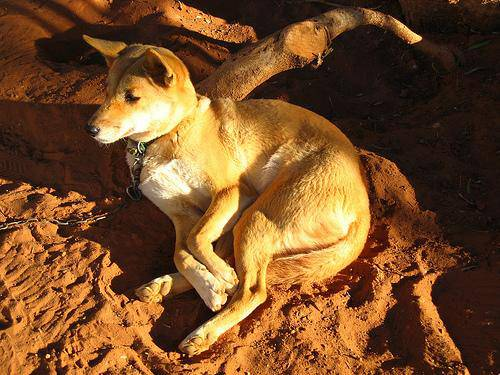

In [3]:
# view a image
from IPython.display import Image
Image("/content/drive/MyDrive/Colab Notebooks/dog-vision-data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

In [4]:
# create a filename list with label csv
filenames = ["/content/drive/MyDrive/Colab Notebooks/dog-vision-data/train/" + filename + ".jpg" for filename in labels_csv["id"]]

# check
filenames[:3]
# Image('/content/drive/MyDrive/Colab Notebooks/dog-vision-data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

['/content/drive/MyDrive/Colab Notebooks/dog-vision-data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-vision-data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-vision-data/train/001cdf01b096e06d78e9e5112d419397.jpg']

In [5]:
# Compare the number of data in the list above, see if it match the number of files in folder.
import os
count_files = len(os.listdir('/content/drive/MyDrive/Colab Notebooks/dog-vision-data/train/'))
count_list = len(filenames)
print(count_files, count_list)

10222 10222


In [9]:
# check image by index
# Image(filenames[9000])
# works well

In [6]:
# Turn labels into a numberical datatype named labels_breeds

# turn labels_csv["breed"] into array
import numpy as np

labels_breeds_name = labels_csv["breed"].to_numpy()
# labels_breeds[:3]

# check the number of breeds to see if it match the number of filenames.
# len(labels_breeds_name) == len(filenames)
# output: True

# check labels_csv breeds's unique elements
unique_breeds = np.unique(labels_breeds_name)
len(unique_breeds)
# output: 120

# turn the breeds labels into numbers.
labels_breeds = [(label == unique_breeds) for label in labels_breeds_name]
labels_breeds[:2]
# into 0, 1 just need a astype(int)

# check if it is right
print(labels_breeds_name[0])  # the first label
print(np.where(labels_breeds_name[0] == unique_breeds))  # get the index of label 0 in unique_breeds
print(labels_breeds[0])
# result is OK

boston_bull
(array([19]),)
[False False False False False False False False False False False False
 False False False False False False False  True False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False]


### Minimize the time between experiments. Use 1000 image to do the first one step.

In [7]:
# Split the train data into train data and validation data.
NUM_IMAGES = 1000
# Need validation data!
X = filenames
y = labels_breeds

from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [12]:
# check the data
# X_train[:3], y[:3]

### Turn images into tensors

### create a function to do the preprocessing on image.
1.   Take one image from filepath as input.
2.   Use tensorflow to read the file and save it into a variable
3.   Turn the image into tensors.
4.   Resize the image to be a shape of (224, 224).
5.   Return the modified image.

In [8]:
# See sth about image, what is a image.
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape
# output: ((257, 350, 3)   257 is the height, 350 is the width, 3 is channel.
image.max(), image.min()  # max and min pixel of the image.check the data, see they are all above 255

(255, 0)

In [9]:
image[0] # pixel matrix

array([[ 89, 137,  89],
       [ 76, 124,  76],
       [ 63, 111,  61],
       ...,
       [ 77, 133,  86],
       [ 76, 134,  86],
       [ 76, 134,  86]], dtype=uint8)

In [10]:
# try to turn image into a tensor
tf.constant(image)[0]  # seems just like a array but is a tensor.

<tf.Tensor: shape=(350, 3), dtype=uint8, numpy=
array([[ 89, 137,  89],
       [ 76, 124,  76],
       [ 63, 111,  61],
       ...,
       [ 77, 133,  86],
       [ 76, 134,  86],
       [ 76, 134,  86]], dtype=uint8)>

### Why need resize the image?
In TensorFlow, resizing images is commonly done for several reasons in image processing or deep learning tasks:

1. **Model Input Requirements:** Many deep learning models require input images to have a fixed size. This is because the architecture of deep neural networks often has a fixed number of input nodes, and the size of input images needs to match the number of these nodes. Therefore, resizing images to the expected input size of the model is necessary.

2. **Computational Efficiency:** Larger images may require more computational resources, especially during model training and inference. Resizing images to an appropriate size helps reduce the computational burden, speeding up the training and inference processes.

3. **Data Consistency:** Resizing images ensures data consistency, ensuring that all images input to the model have the same size. This helps ensure consistent behavior when the model processes different images.

4. **Preventing Overfitting:** In some cases, resizing images to a smaller size can reduce the risk of overfitting. Oversized input images may lead the model to learn unnecessary details, and resizing helps the model focus on the main features of the images.

5. **Memory and Storage Constraints:** Larger images may require more memory and storage space. Resizing helps reduce these requirements, making it more feasible to handle a larger number of images.

In summary, resizing images is done to meet model input requirements, improve computational efficiency, ensure data consistency, and, in some cases, prevent overfitting. When using TensorFlow or other deep learning frameworks, image resizing is typically performed during the data preprocessing stage.

### ✅process_image(image_path, img_size=IMG_SIZE)

In [11]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
    """
    Takes an image file path and turns the image into a Tensor.
    """
    # Read in an image file
    image = tf.io.read_file(image_path)
    # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
    image = tf.image.decode_jpeg(image, channels=3)
    # Convert the colour channel values from 0-255 to 0-1 values
    image = tf.image.convert_image_dtype(image, tf.float32)
    # Resize the image to our desired value (224, 224)
    image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

    return image

### Turn the train data into batches (image, label), 32 images a batch.

### ✅get_image_label(image_path, label)

In [14]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
    """
    Takes an image file path name and the assosciated label,
    processes the image and reutrns a typle of (image, label).
    """
    image = process_image(image_path)
    return image, label

In [15]:
# test
get_image_label(X[0], y[0])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.5705322 , 0.33588538, 0.15008473],
         [0.66901225, 0.4601166 , 0.26022965],
         [0.61062384, 0.43763596, 0.21601713],
         ...,
         [0.8182312 , 0.7297958 , 0.26963907],
         [0.72454786, 0.6059109 , 0.2653059 ],
         [0.7494603 , 0.6252918 , 0.32456532]],
 
        [[0.6761415 , 0.4733761 , 0.30642927],
         [0.5672121 , 0.38192675, 0.20349538],
         [0.5883547 , 0.4322571 , 0.2403155 ],
         ...,
         [0.9326942 , 0.8260503 , 0.41093278],
         [0.86072475, 0.74250627, 0.3694122 ],
         [0.76781666, 0.6461604 , 0.29291284]],
 
        [[0.46350825, 0.29595745, 0.1536156 ],
         [0.42554107, 0.27039403, 0.12009468],
         [0.7887875 , 0.6547362 , 0.49015   ],
         ...,
         [0.89372385, 0.7696401 , 0.41811958],
         [0.88609535, 0.7585918 , 0.36495727],
         [0.8243601 , 0.69494826, 0.2930575 ]],
 
        ...,
 
        [[0.7344025 , 0.4716574 

### ✅create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False)

In [57]:
# Turn data into batch size 32
BATCH_SIZE = 32

# Create a function to turn data into batch
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    '''
    Create batches of data out of image X, and label y pairs.
    Shuffles the data if it's training data but doesn't shuffle if it's validation data.
    Also accepts test data as input (no labels).
    '''
    # test data doesn't have labels.
    if test_data:
        print("Creating test data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
        data_batch = data.map(process_image).batch(BATCH_SIZE)
        return data_batch

    # valid data do not need shuffle.
    elif valid_data:
        print("Creating valid data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
        data_batch = data.map(get_image_label).batch(BATCH_SIZE)
        return data_batch

    # train data
    else:
        print("Creating train data batches...")
        # Turn filepath and label into tensors.
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
        # Shuffling pathnames and labels before mapping function.
        data = data.shuffle(buffer_size=len(X))
        # shuffle before map will be fast.
        # create (image, label) tuples.
        data = data.map(get_image_label)
        # create batches.
        data_batch = data.batch(BATCH_SIZE)

    return data_batch


In [17]:
# Create training data and validation data batches.
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating train data batches...
Creating valid data batches...


In [18]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

### ✅show_25_images(images, labels)

In [19]:
# Visualizition of the batches because it's not easy to understand.
import matplotlib.pyplot as plt

def show_25_images(images, labels):
    '''
    Display a plot of 25 images and their labels from data batch.
    '''
    plt.figure(figsize=(10, 10))
    # Loop through 25 (for displaying 25 images)
    for i in range(25):
        # create subplots with 5 rows, 5 columns
        ax = plt.subplot(5, 5, i+1)
        # display an image
        plt.imshow(images[i])
        # add the image label as the title
        plt.title(unique_breeds[labels[i].argmax()])
        # turn the grid lines off
        plt.axis("off")

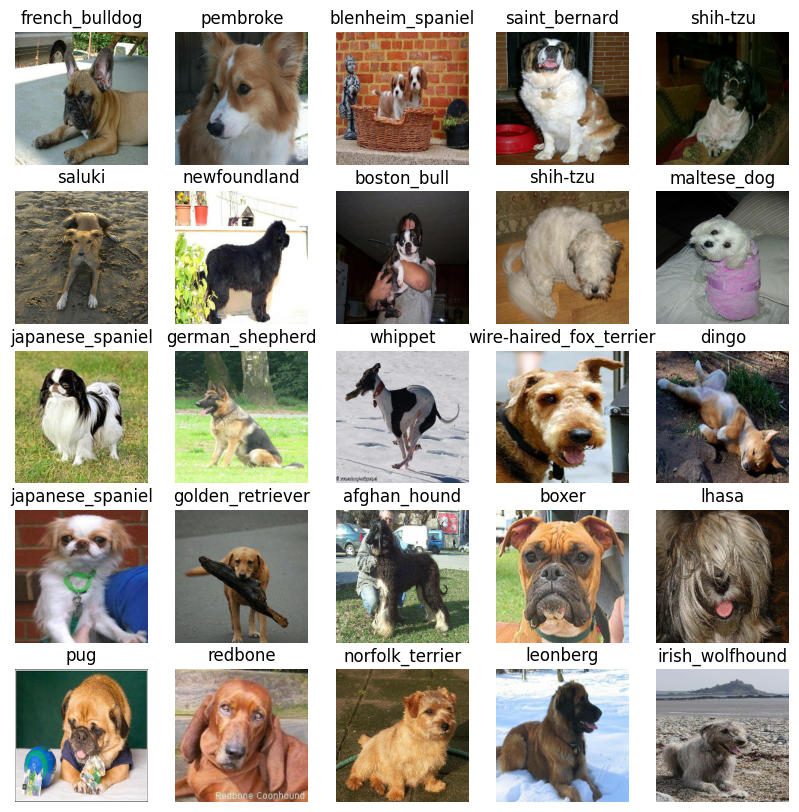

In [21]:
train_images, train_labels = next(train_data.as_numpy_iterator())
# train_images, train_labels
# len(train_images), len(train_labels)  # (32, 32)
show_25_images(train_images, train_labels)  # 25 good puppys will show

## 2.Build a model

### define the input and the output.
the model is in a form of url.
https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

Keras is the high-level API of the TensorFlow platform.
https://www.tensorflow.org/guide/keras

In [22]:
# input
INPUT_SHAPE = [None, 224, 224, 3]
# output
OUTPUT_SHAPE = len(unique_breeds)
# model
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

### ✅create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL)

In [23]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building model with:", MODEL_URL)

    # Setup the model layers
    model = tf.keras.Sequential([
        hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
        tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layer)
    ])

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
        optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
        metrics=["accuracy"] # We'd like this to go up
    )

    # Build the model
    model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

    return model

In [24]:
# Create a model and check its details
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### Create callback
Callbacks are helper function.
during training.
save progress.
stop training early.
1.  Tensorboard.
2.  Early stopping. (preventing overfitting)

### ✅create_tensorboard_callback()

In [25]:
# load tensorboard
%load_ext tensorboard
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
    # Create a log directory for storing TensorBoard logs
    logdir = os.path.join("/content/drive/MyDrive/Colab Notebooks/dog-vision-data/logs",
                            # Make it so the logs get tracked whenever we run an experiment
                            datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    return tf.keras.callbacks.TensorBoard(logdir)

# equal:
# tf.keras.callbacks.TensorBoard(os.path.join("/content/drive/MyDrive/Colab Notebooks/dog-vision-data/logs",
#                                             datetime.datetime.now().strftime("%Y%m%d-%H%M%S")))

In [26]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

## 3.Train a model
on a subset of 1000 data.
epoch is each data once.

### ✅train_model()

In [27]:
NUM_EPOCHS = 100
# make sure using a GPU
# Build a function to train and return a trained model
def train_model():
    """
    Trains a given model and returns the trained version.
    """
    model = create_model()
    tensorboard = create_tensorboard_callback()
    model.fit(x=train_data,
                    epochs=NUM_EPOCHS,
                    callbacks=[tensorboard, early_stopping],
                    validation_data=val_data,
                    validation_freq=1)
    return model

In [28]:
# train the model
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 234s 9s/step - loss: 4.5765 - accuracy: 0.1100 - val_loss: 3.5421 - val_accuracy: 0.2550
Epoch 2/100
25/25 [==============================] - 3s 137ms/step - loss: 1.6643 - accuracy: 0.6712 - val_loss: 2.2968 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 3s 115ms/step - loss: 0.5682 - accuracy: 0.9350 - val_loss: 1.7801 - val_accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 3s 106ms/step - loss: 0.2531 - accuracy: 0.9875 - val_loss: 1.5779 - val_accuracy: 0.6450
Epoch 5/100
25/25 [==============================] - 3s 103ms/step - loss: 0.1476 - accuracy: 0.9962 - val_loss: 1.4929 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 3s 138ms/step - loss: 0.1025 - accuracy: 1.0000 - val_loss: 1.4539 - val_accuracy: 0.6550
Epoch 7/100
25/25 [==============================]

### How to prevent overfitting? thinking
* Method 1: Data augmentation.
* Method 2: Simplifying neural network.
* Method 3: Weight regularization.
* Method 4: Dropouts.
* Method 5: Early stopping.


### Check the tensorboard logboard

In [29]:
# check che tensorboard logs to visualize the process of training
%tensorboard --logdir /content/drive/MyDrive/Colab\ Notebooks/dog-vision-data/logs

<IPython.core.display.Javascript object>

## 4.Evaluate and make predictions with model.**加粗文字**

In [30]:
# make predictions use val data.
predictions = model.predict(val_data, verbose=1)  # verbose means show the progress
print(predictions)
print(predictions.shape)
# output (200, 120)  mean every breed's probability.  x% to be that breed
print(predictions[0])  # one prediction
print(np.sum(predictions[0])) # close to 1,that is 100%

7/7 [==============================] - 48s 86ms/step
[[2.42565246e-03 3.40781902e-04 1.00597565e-03 ... 4.91287385e-04
  4.44487741e-05 7.93115143e-03]
 [2.46817758e-03 9.66027437e-04 1.27097219e-02 ... 1.64511532e-03
  5.08518191e-04 5.76067017e-04]
 [1.85646095e-05 7.88241334e-04 2.86374823e-04 ... 4.49639105e-04
  1.12470041e-03 4.30527888e-03]
 ...
 [4.52799250e-05 3.01713793e-04 3.41875944e-04 ... 2.68488420e-05
  1.68966690e-05 2.03188480e-04]
 [7.65506970e-03 2.73539219e-04 8.61359149e-05 ... 1.20859724e-04
  6.22048829e-05 2.32946184e-02]
 [1.53767294e-03 1.99765418e-04 1.69697974e-03 ... 6.96515013e-03
  4.70685633e-03 8.00928174e-05]]
(200, 120)
[2.4256525e-03 3.4078190e-04 1.0059756e-03 1.0791890e-04 4.4212388e-04
 1.5667189e-04 1.5885647e-02 5.9821928e-04 2.7697621e-04 3.2275296e-03
 2.7332962e-03 3.1374517e-04 8.6789951e-04 9.8339551e-05 5.7901689e-05
 1.0804289e-03 4.2336458e-05 1.6171983e-01 7.2918905e-05 4.8439888e-05
 3.8706392e-04 1.9233514e-04 5.1378640e-05 2.3451359

In [32]:
# get first element's breed(result).
index = 0
# print(predictions[index])
print(f"Find the max value!that is {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
max_index = np.argmax(predictions[index])
print(f"Max index: {max_index}")
print(f"Predicted label: {unique_breeds[max_index]}")

Find the max value!that is 0.18626827001571655
Sum: 1.0
Max index: 26
Predicted label: cairn


### Prediction Probability & Confidence Level
they are related, but not the same.
too high confidence may cause overfitting.

### Define functions to compare the predictions to the true label.
1. get label function
2. unbatch function
3. plot pred function
4. plot top 10 probabilities of the prediction


### ✅get_pred_label(prediction_probabilities)

In [33]:
# make a funciton to get predictions label easily.
def get_pred_label(prediction_probabilities):
    '''
    Turns an array of prediction probabilities into a label.
    '''
    return unique_breeds[np.argmax(prediction_probabilities)]

# test
pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

### ✅unbatchify(data)

In [34]:
# unbatch the dataset to check images
# I think we can use the data before batched.

# unbatch function
def unbatchify(data):
    """
    Takes a batched dataset of (image, label) Tensors and returns separate arrays
    of images and labels.
    """
    images = []
    labels = []
    # Loop through unbatched data
    for image, label in data.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(unique_breeds[np.argmax(label)])
    return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

### ✅plot_pred(prediction_probabilities, labels, images, n=1)

In [36]:
# finally the check image function
# prediction_probabilities is an array of a predictions element
# labels and images are the data unbatched above
# n is a index
def plot_pred(prediction_probabilities, labels, images, n=1):
    """
    View the prediction, ground truth label and image for sample n.
    """
    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

    # get a pred label
    pred_label = get_pred_label(pred_prob)
    # Plot image & remove ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # define the color, if it is right be green, if wrong be red.
    if pred_label == true_label:
        color = 'green'
    else:
        color = 'red'

    plt.title("{} {:2.0f}% ({})".format(pred_label,
                                        np.max(pred_prob)*100,
                                        true_label),
                                        color=color)

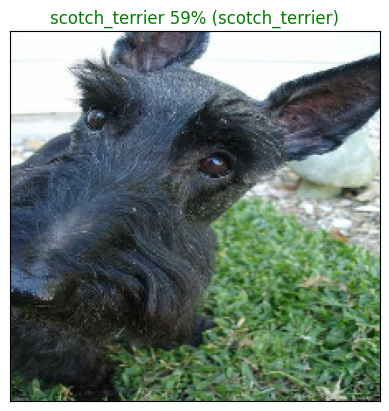

In [37]:
# See what happens.
plot_pred(prediction_probabilities=predictions,
              labels=val_labels,
              images=val_images,
              n=1)

### ✅plot_pred_conf(prediction_probabilities, labels, n=1)

In [38]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
    """
    Plots the top 10 highest prediction confidences along with
    the truth label for sample n.
    """
    pred_prob, true_label = prediction_probabilities[n], labels[n]

    # Get the predicted label
    pred_label = get_pred_label(pred_prob)

    # Find the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    # Find the top 10 prediction confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]
    # Find the top 10 prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    # Setup plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                        top_10_pred_values,
                        color="grey")
    plt.xticks(np.arange(len(top_10_pred_labels)),
                labels=top_10_pred_labels,
                rotation="vertical")

    # Change color of true label
    if np.isin(true_label, top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    else:
        pass

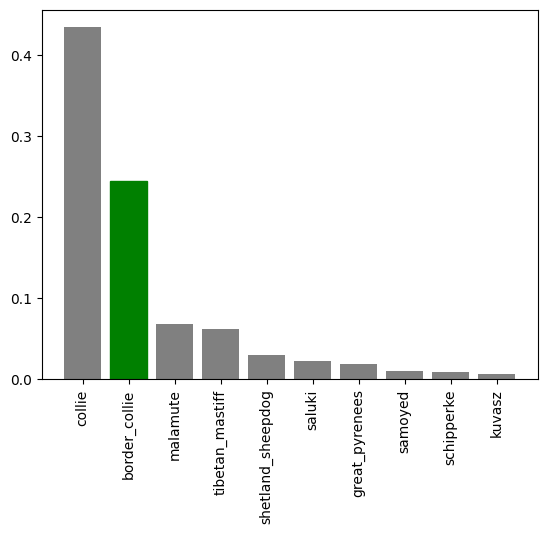

In [39]:
plot_pred_conf(prediction_probabilities=predictions,
                       labels=val_labels,
                       n=9)

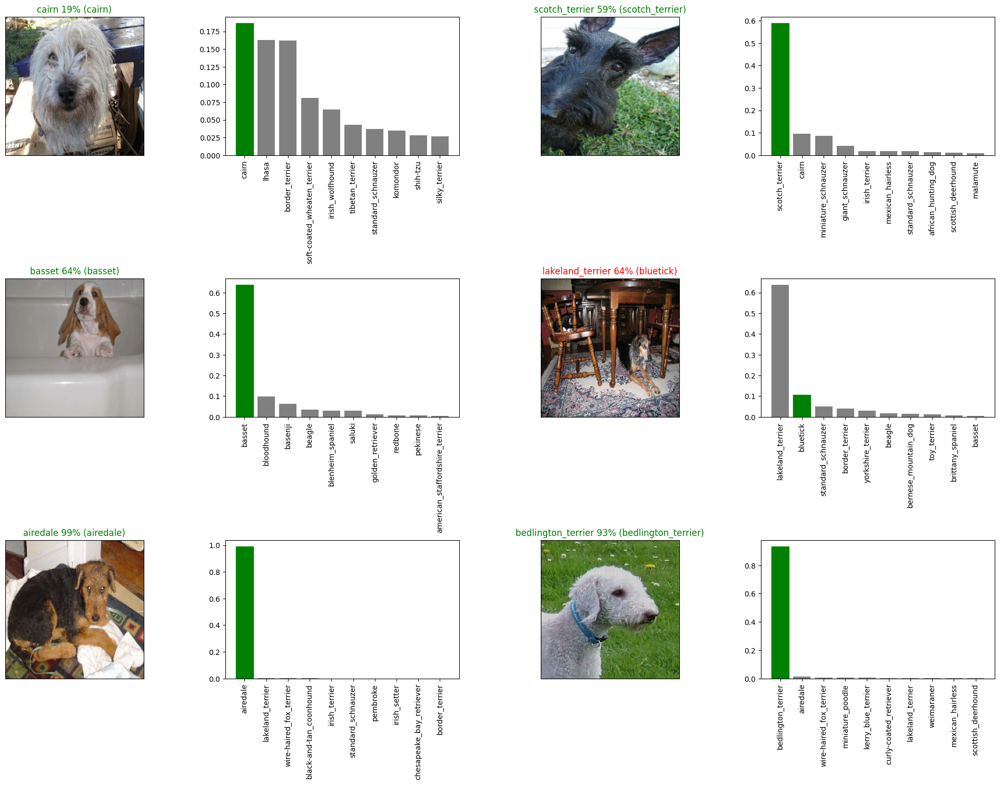

In [40]:
# combine the image and the bar visual above
# check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))  # (5x4cols, 5x3rows)
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)  # 1, 3
  plot_pred(prediction_probabilities=predictions,
                 labels=val_labels,
                 images=val_images,
                 n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)  # 2, 4
  plot_pred_conf(prediction_probabilities=predictions,
                         labels=val_labels,
                         n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## 5.Save and reload model
https://www.tensorflow.org/tutorials/keras/save_and_load

### ✅save_model(model, suffix=None);load_model(model_path)

In [41]:
# Create functions to save and load model.
def save_model(model, suffix=None):
    '''
    Save a model in a models directory and appends a suffix.
    '''
    modeldir = os.path.join("/content/drive/MyDrive/Colab Notebooks/dog-vision-data/models",
                                        datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
    model_path = modeldir + "-" + suffix + ".h5"
    print(f"Saving model to: {model_path}...")
    model.save(model_path)
    return model_path

def load_model(model_path):
    '''
    Loads a model from a specified path.
    '''
    print(f"Loading saved model from {model_path}...")
    model = tf.keras.models.load_model(model_path,
                                                            custom_objects={"KerasLayer": hub.KerasLayer})
    return model

In [42]:
# save model
save_model(model, suffix="dog-vision-mobilenetv2-version1")

Saving model to: /content/drive/MyDrive/Colab Notebooks/dog-vision-data/models/20231115-11311700047867-dog-vision-mobilenetv2-version1.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Colab Notebooks/dog-vision-data/models/20231115-11311700047867-dog-vision-mobilenetv2-version1.h5'

In [43]:
# load model
model_version1 =  load_model("/content/drive/MyDrive/Colab Notebooks/dog-vision-data/models/20231115-11311700047867-dog-vision-mobilenetv2-version1.h5")

Loading saved model from /content/drive/MyDrive/Colab Notebooks/dog-vision-data/models/20231115-11311700047867-dog-vision-mobilenetv2-version1.h5...


In [44]:
# check the model
print(model.evaluate(val_data))
print(model_version1.evaluate(val_data))

7/7 [==============================] - 1s 107ms/step - loss: 1.3339 - accuracy: 0.6750
[1.333867073059082, 0.675000011920929]
7/7 [==============================] - 2s 96ms/step - loss: 1.3339 - accuracy: 0.6750
[1.333867073059082, 0.675000011920929]


## 6.Train the model on FULL data.
10222data

In [46]:
# create a data batch
full_data = create_data_batches(X, y)
# create a model
full_model = create_model()
# create full model callback
full_model_tensorboard = create_tensorboard_callback()
# Create early stopping (once our model stops improving, stop training)
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

Creating train data batches...
Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [48]:
# fit the full model
full_model.fit(x=full_data,
                    epochs=NUM_EPOCHS,
                    callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 2181s 7s/step - loss: 1.3380 - accuracy: 0.6665
Epoch 2/100
320/320 [==============================] - 32s 100ms/step - loss: 0.4018 - accuracy: 0.8803
Epoch 3/100
320/320 [==============================] - 32s 99ms/step - loss: 0.2413 - accuracy: 0.9357
Epoch 4/100
320/320 [==============================] - 32s 99ms/step - loss: 0.1525 - accuracy: 0.9633
Epoch 5/100
320/320 [==============================] - 31s 98ms/step - loss: 0.1067 - accuracy: 0.9787
Epoch 6/100
320/320 [==============================] - 32s 101ms/step - loss: 0.0797 - accuracy: 0.9856
Epoch 7/100
320/320 [==============================] - 32s 100ms/step - loss: 0.0586 - accuracy: 0.9922
Epoch 8/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0458 - accuracy: 0.9947
Epoch 9/100
320/320 [==============================] - 32s 101ms/step - loss: 0.0377 - accuracy: 0.9962
Epoch 10/100
320/320 [==============================] - 32s 101ms/st

### Save the model

In [49]:
# Save the model
save_model(full_model, suffix="dog-vision-mobilenetv2-version-full")

Saving model to: /content/drive/MyDrive/Colab Notebooks/dog-vision-data/models/20231115-12361700051796-dog-vision-mobilenetv2-version-full.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Colab Notebooks/dog-vision-data/models/20231115-12361700051796-dog-vision-mobilenetv2-version-full.h5'

In [63]:
# Load in the full model
loaded_full_model = load_model("/content/drive/MyDrive/Colab Notebooks/dog-vision-data/models/20231115-12361700051796-dog-vision-mobilenetv2-version-full.h5")

Loading saved model from /content/drive/MyDrive/Colab Notebooks/dog-vision-data/models/20231115-12361700051796-dog-vision-mobilenetv2-version-full.h5...


## 7.Prediction on test data
### In order to do this, need to precess the test data.

In [51]:
# Make predictions on test data
test_path = "/content/drive/MyDrive/Colab Notebooks/dog-vision-data/test/"
test_files = [test_path + filename for filename in os.listdir(test_path)]
print(test_files[:3])
print(len(test_files))

['/content/drive/MyDrive/Colab Notebooks/dog-vision-data/test/e1cfddc1d5315f1dba011c6152822786.jpg', '/content/drive/MyDrive/Colab Notebooks/dog-vision-data/test/e5ba665e01b6927411d60158f28160dd.jpg', '/content/drive/MyDrive/Colab Notebooks/dog-vision-data/test/e702ddff98bd0b05ab200ffb43fb080a.jpg']
10357


In [58]:
# Create the test data batches.
test_data = create_data_batches(test_files, test_data=True)

Creating test data batches...


In [59]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [68]:
# Make predictions
test_predictions = loaded_full_model.predict(test_data, verbose=1)

In [67]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("/content/drive/MyDrive/Colab Notebooks/dog-vision-data/preds_array.csv", test_predictions, delimiter=",")
# this will take long time like 1 hour? as the data set is big

## 8.Prepare the predictions for kaggle


In [69]:
test_predictions = np.loadtxt("/content/drive/MyDrive/Colab Notebooks/dog-vision-data/preds_array.csv", delimiter=",")
# print(test_predictions[:3])
print(test_predictions.shape)

(10357, 120)


### format the preds data
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation
Create a pandas dataframe with id and dog breeds probability.

In [70]:
# create a frame
import pandas as pd
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [71]:
# Extract the filename from the file path
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1cfddc1d5315f1dba011c6152822786,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e5ba665e01b6927411d60158f28160dd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e702ddff98bd0b05ab200ffb43fb080a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e0f9b92adbba451d296678f466732969,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e241e149039740594a6af60dc18b269b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [72]:
# Set the prediction data
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1cfddc1d5315f1dba011c6152822786,9.161236e-09,1.057131e-13,2.699460e-09,3.236598e-12,1.926746e-09,1.508064e-11,3.309801e-09,9.840559e-09,1.165042e-11,...,4.110832e-06,7.176074e-06,2.281446e-10,4.039882e-09,1.718927e-09,3.509840e-11,4.203033e-09,1.815123e-05,1.020003e-10,5.846660e-10
1,e5ba665e01b6927411d60158f28160dd,1.332432e-09,7.667587e-10,9.990627e-01,7.646188e-11,5.758233e-10,2.572009e-12,1.026868e-05,4.477382e-09,6.120647e-10,...,6.853591e-08,1.976951e-07,1.673969e-09,1.285450e-11,2.391063e-10,3.990600e-09,6.657346e-10,4.421075e-10,5.754840e-10,3.187650e-10
2,e702ddff98bd0b05ab200ffb43fb080a,1.229858e-04,4.374785e-06,3.202256e-07,8.591899e-09,8.656908e-09,3.419408e-09,7.139596e-09,1.264306e-07,2.986185e-08,...,1.092783e-05,3.573116e-08,2.877429e-11,2.699267e-10,2.688098e-10,3.172270e-09,3.608693e-06,5.586858e-09,2.060720e-06,7.303991e-06
3,e0f9b92adbba451d296678f466732969,2.240400e-08,1.210501e-12,6.681849e-09,2.415262e-11,6.411563e-06,1.016480e-06,2.524576e-05,9.864668e-01,6.195207e-09,...,2.066098e-06,8.322329e-03,1.293121e-07,8.427886e-05,9.914591e-10,1.866176e-07,3.126506e-07,1.381881e-06,4.448438e-06,1.848126e-08
4,e241e149039740594a6af60dc18b269b,2.711483e-08,3.664564e-07,1.781410e-09,7.789286e-09,1.845030e-11,3.776940e-07,2.382792e-08,9.824030e-09,7.335085e-10,...,2.950084e-01,6.115956e-07,2.656170e-07,2.603741e-08,3.788249e-07,2.052840e-09,8.937668e-07,9.150590e-10,3.679400e-08,9.888527e-08


In [73]:
# Save result to csv for submission to kaggle
preds_df.to_csv("/content/drive/MyDrive/Colab Notebooks/dog-vision-data/model_predictions_submission.csv", index=False)
#Upload it to kaggle.

## 9.Predict on custom data

In [106]:
# Get the cumstom image filepath
custom_path = "/content/drive/MyDrive/Colab Notebooks/dog-vision-data/custom_data/"
custom_image_path = [custom_path + filename for filename in os.listdir(custom_path)]
print(custom_image_path)

['/content/drive/MyDrive/Colab Notebooks/dog-vision-data/custom_data/MBS_DogEvolution_blg_031820.jpg', '/content/drive/MyDrive/Colab Notebooks/dog-vision-data/custom_data/dog-puppy-on-garden-royalty-free-image-1586966191.jpg']


In [107]:
# create batch dataset
custom_data = create_data_batches(custom_image_path, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [108]:
# predictions
custom_preds = loaded_full_model.predict(custom_data)
# custom_preds

1/1 [==============================] - 0s 45ms/step


In [109]:
len(custom_preds)

2

In [110]:
# get the prediction label
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['dingo', 'saluki']

In [111]:
# Also can check the image
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
    custom_images.append(image)

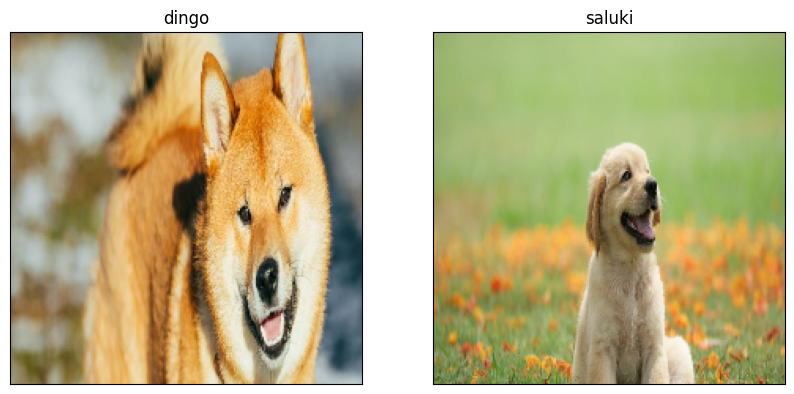

In [112]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
    plt.subplot(1, 2, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.title(custom_pred_labels[i])
    plt.imshow(image)